In [1]:
import cv2
import utils
import numpy as np
from matplotlib import pyplot as plt

from deepface.DeepFace import build_model
from deepface.detectors import FaceDetector

import torch
from torchvision import models, transforms
from PIL import Image

## Face Branch (DeepFace)

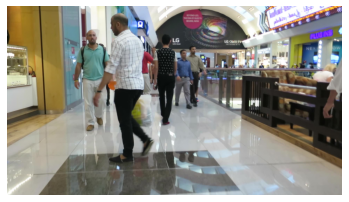

In [80]:
custom_imgpath = "/home/emili/Documents/Universitat/TFG/datasets/MOT17-11/img1/000757.jpg"
plt.imshow(plt.imread(custom_imgpath))
plt.axis('off')
img = cv2.imread(custom_imgpath)

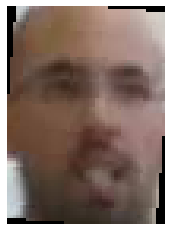

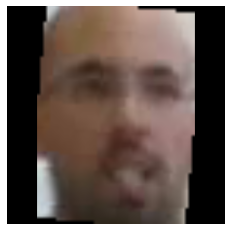

[0. 1.] [1.0, 5.648328119163178e-20, 0.0, 0.0]


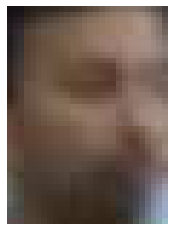

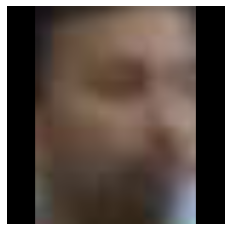

[0. 1.] [1.0, 0.0, 0.0, 0.0]


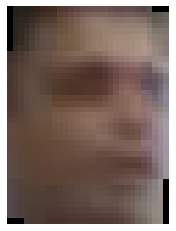

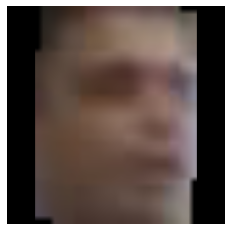

[0. 1.] [1.0, 5.745045391196547e-28, 0.0, 0.0]


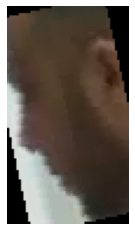

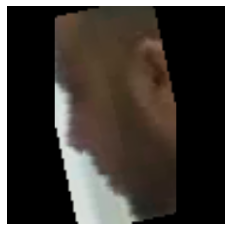

[0. 1.] [0.02139441162596635, 0.9028959887251432, 0.07552325089085161, 0.00018634875803882878]


In [76]:
# Detection
detector = FaceDetector.build_model("retinaface")
preds = FaceDetector.detect_faces(detector, "retinaface", img)

# Inference
agemod = build_model('Age')
genmod = build_model('Gender')
for det, bbox in preds:
    det_224 = utils.smart_resize(det)
    plt.imshow(cv2.cvtColor(det, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    plt.imshow(cv2.cvtColor(det_224, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    det_224 = np.expand_dims(det_224, axis=0)
    genpred = genmod.predict(det_224)[0]
    agepred = agemod.predict(det_224)[0]
    print(genpred, utils.age_binning(agepred, nbins=4))

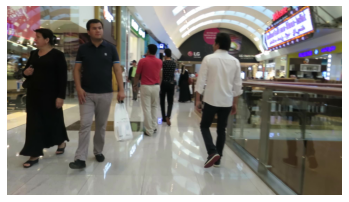

In [96]:
custom_imgpath = "/home/emili/Documents/Universitat/TFG/datasets/MOT17-11/img1/000407.jpg"
plt.imshow(plt.imread(custom_imgpath))
plt.axis('off')
img = cv2.imread(custom_imgpath)

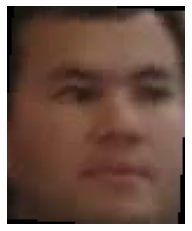

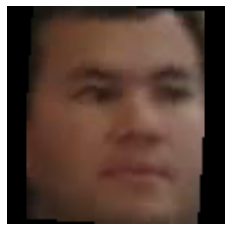

[0. 1.] [1.0, 0.0, 0.0, 0.0]


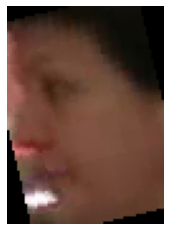

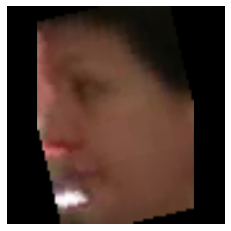

[0. 1.] [1.0, 4.4249682985180954e-29, 0.0, 0.0]


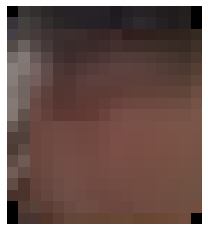

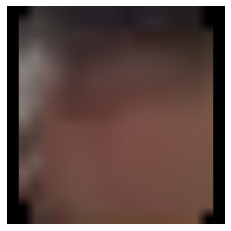

[0. 1.] [1.0, 3.476558286865506e-18, 0.0, 0.0]


In [97]:
# Detection
detector = FaceDetector.build_model("retinaface")
preds = FaceDetector.detect_faces(detector, "retinaface", img)

# Inference
agemod = build_model('Age')
genmod = build_model('Gender')
for det, bbox in preds:
    det_224 = utils.smart_resize(det)
    plt.imshow(cv2.cvtColor(det, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    plt.imshow(cv2.cvtColor(det_224, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    det_224 = np.expand_dims(det_224, axis=0)
    genpred = genmod.predict(det_224)[0]
    agepred = agemod.predict(det_224)[0]
    print(genpred, utils.age_binning(agepred, nbins=4))

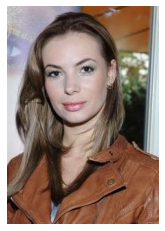

In [3]:
custom_imgpath = "/home/emili/Documents/Universitat/TFG/datasets/CelebA/Img/img_celeba/143364.jpg"
plt.imshow(plt.imread(custom_imgpath))
plt.axis('off')
img = cv2.imread(custom_imgpath)

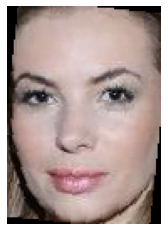

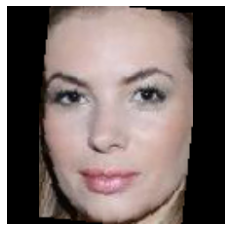

0.0 [4.1069820008787305e-28, 1.0, 0.0, 0.0]
(52, 41, 92, 130)


In [5]:
# Detection
detector = FaceDetector.build_model("retinaface")
preds = FaceDetector.detect_faces(detector, "retinaface", img)

# Inference
agemod = build_model('Age')
genmod = build_model('Gender')
for det, bbox in preds:
    det_224 = utils.smart_resize(det)
    plt.imshow(cv2.cvtColor(det, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    plt.imshow(cv2.cvtColor(det_224, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    det_224 = np.expand_dims(det_224, axis=0)
    genpred = genmod.predict(det_224)[0]
    agepred = agemod.predict(det_224)[0]
    print(genpred[1], utils.age_binning(agepred, nbins=4))
    print(tuple(bbox))

*Model testing*

In [2]:
from models.ours.initial_design import FaceBranch

(-0.5, 220.5, 316.5, -0.5)

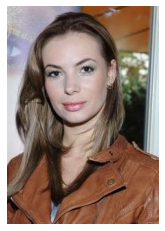

In [3]:
custom_imgpath = "/home/emili/Documents/Universitat/TFG/datasets/CelebA/Img/img_celeba/143364.jpg"
plt.imshow(plt.imread(custom_imgpath))
plt.axis('off')

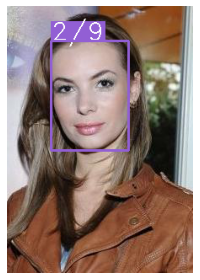

In [6]:
facemod = FaceBranch(nbins=10)
utils.show(utils.draw_annotation(custom_imgpath, utils.pred2ann(facemod.predict(custom_imgpath))), cformat="bgr")

## Body Branch (torchvision)

In [3]:
custom_imgpath = "/home/emili/Documents/Universitat/TFG/datasets/MOT17-11/img1/000757.jpg"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

##### Detection

In [5]:
frcnn = models.detection.fasterrcnn_resnet50_fpn(pretrained=True, pretrained_backbone=True).to(device).eval()
tform = transforms.ToTensor()
img = tform(Image.open(custom_imgpath))
pred = frcnn([img])[0]

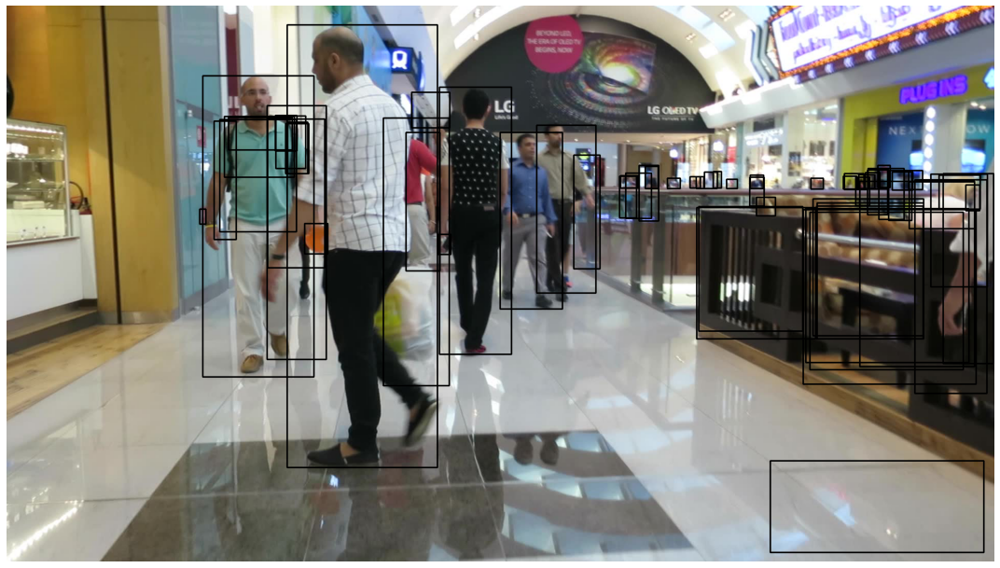

In [6]:
dets = []
for i in range(len(pred['boxes'])):
    bbox = tuple([round(n) for n in pred['boxes'][i].detach().numpy()])
    label, score = int(pred['labels'][i].detach().numpy()), float(pred['scores'][i].detach().numpy())
    dets.append({'bbox':bbox, 'score':score})
utils.show(utils.draw_annotation(custom_imgpath, dets), size=(15, 15), cformat="bgr")

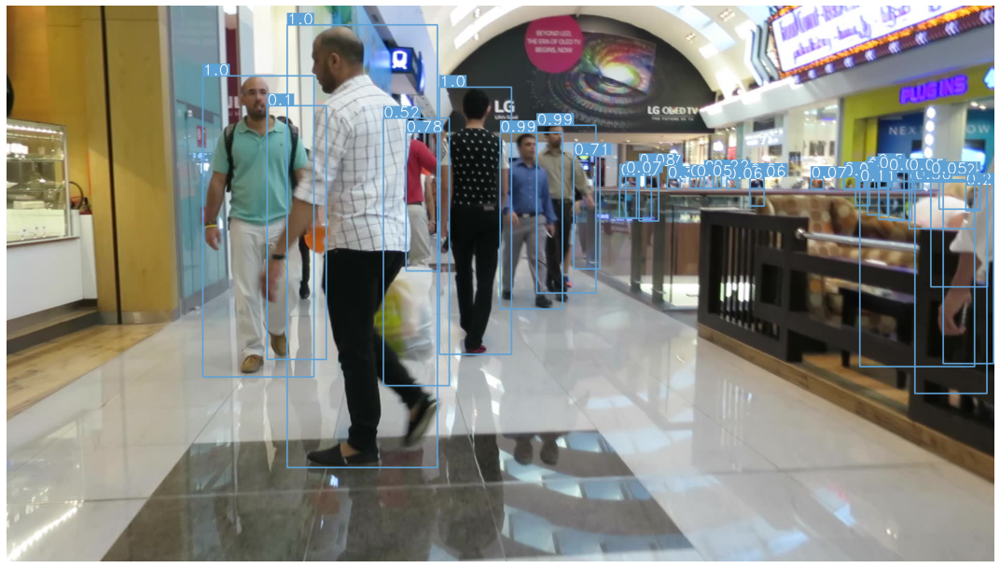

In [7]:
dets = []
for i in range(len(pred['boxes'])):
    bbox = tuple([round(n) for n in pred['boxes'][i].detach().numpy()])
    label, score = int(pred['labels'][i].detach().numpy()), float(pred['scores'][i].detach().numpy())
    if label == 1:
        dets.append({'bbox':bbox, 'gender':"Man", 'age':round(score, 2)})

utils.show(utils.draw_annotation(custom_imgpath, dets), size=(15, 15), cformat="bgr")

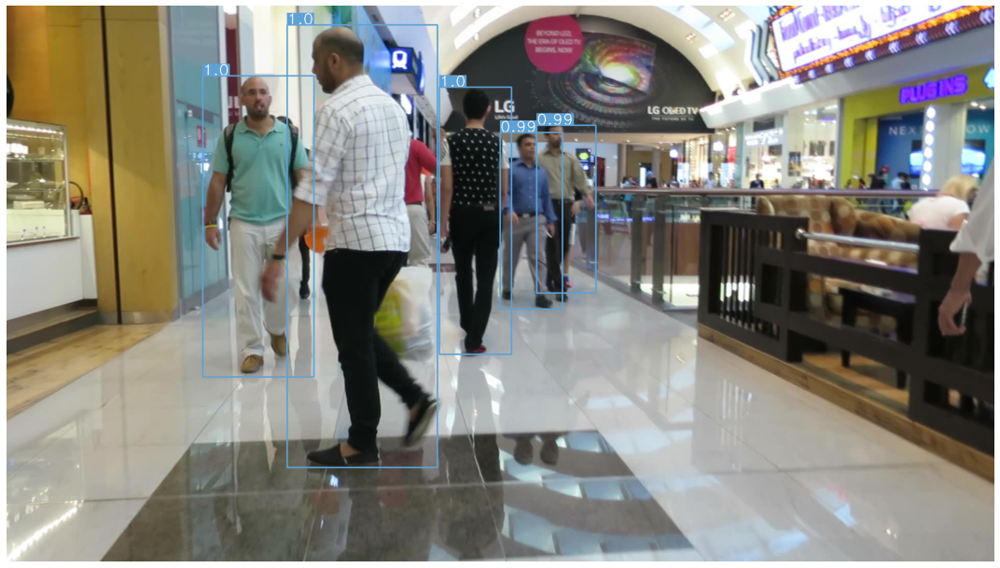

In [8]:
dets = []
for i in range(len(pred['boxes'])):
    bbox = tuple([round(n) for n in pred['boxes'][i].detach().numpy()])
    label, score = int(pred['labels'][i].detach().numpy()), float(pred['scores'][i].detach().numpy())
    if label == 1 and score > 0.95:
        dets.append({'bbox':bbox, 'gender':"Man", 'age':round(score, 2)})

utils.show(utils.draw_annotation(custom_imgpath, dets), size=(15, 15), cformat="bgr")

In [4]:
frcnn = models.detection.retinanet_resnet50_fpn(pretrained=True, pretrained_backbone=True).to(device).eval()
tform = transforms.ToTensor()
img = tform(Image.open(custom_imgpath))
pred = frcnn([img])[0]

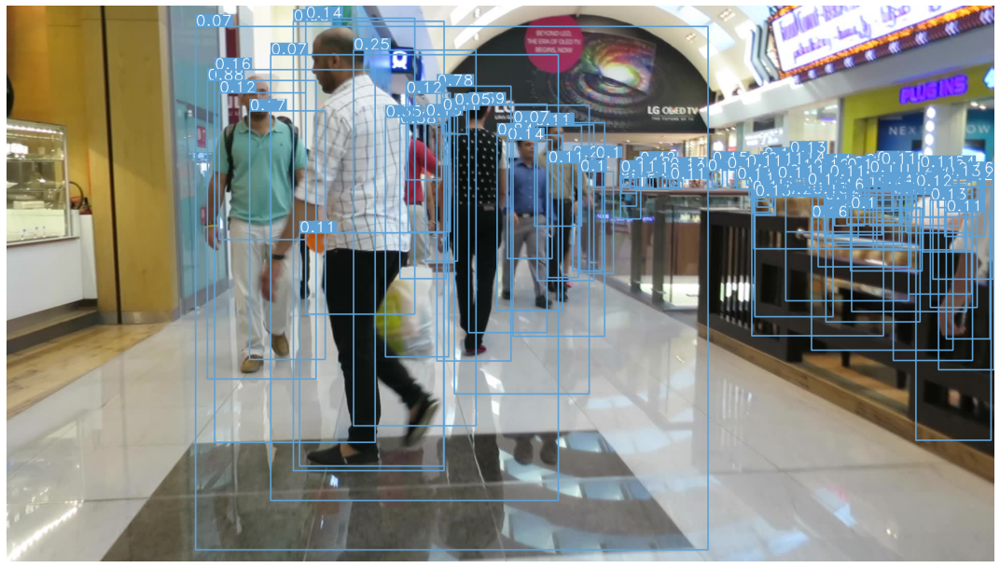

In [12]:
dets = []
for i in range(len(pred['boxes'])):
    bbox = tuple([round(n) for n in pred['boxes'][i].detach().numpy()])
    label, score = int(pred['labels'][i].detach().numpy()), float(pred['scores'][i].detach().numpy())
    if label == 1:
        dets.append({'bbox':bbox, 'gender':"Man", 'age':round(score, 2)})

utils.show(utils.draw_annotation(custom_imgpath, dets), size=(15, 15), cformat="bgr")

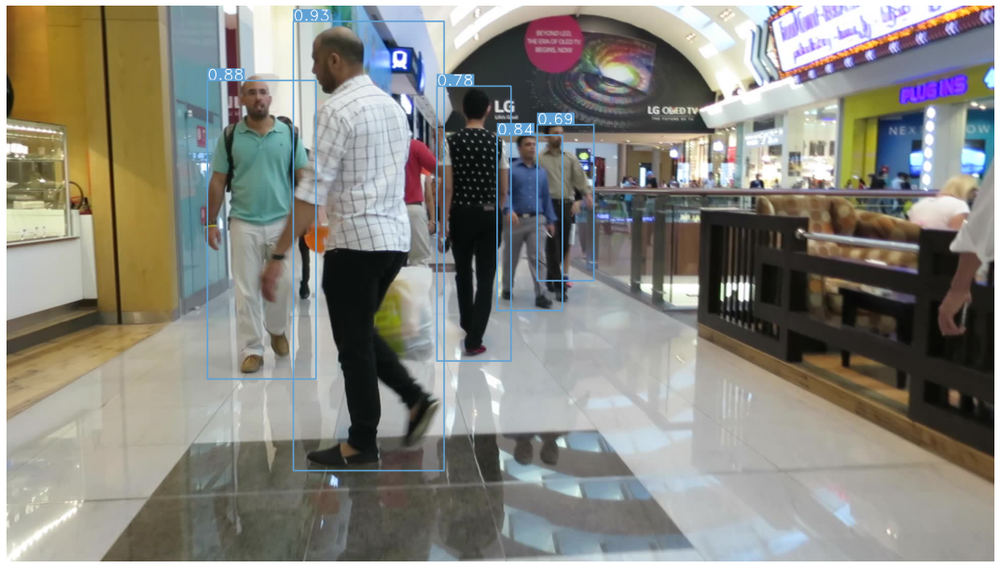

In [5]:
dets = []
for i in range(len(pred['boxes'])):
    bbox = tuple([round(n) for n in pred['boxes'][i].detach().numpy()])
    label, score = int(pred['labels'][i].detach().numpy()), float(pred['scores'][i].detach().numpy())
    if label == 1 and score > 0.65:
        dets.append({'bbox':bbox, 'gender':"Man", 'age':round(score, 2)})
utils.show(utils.draw_annotation(custom_imgpath, dets), size=(15, 15), cformat="bgr")

(-0.5, 109.5, 302.5, -0.5)

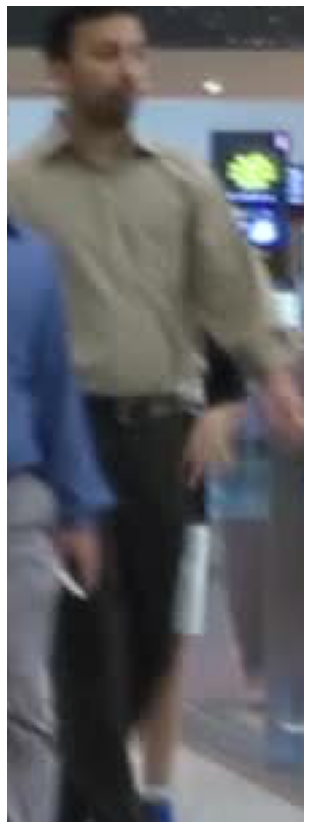

In [6]:
idx = 4
det = transforms.functional.crop(img, top=dets[idx]['bbox'][1], left=dets[idx]['bbox'][0], height=dets[idx]['bbox'][3]-dets[idx]['bbox'][1], width=dets[idx]['bbox'][2]-dets[idx]['bbox'][0])
plt.figure(figsize=(15, 15))
plt.imshow(det.permute(1,2,0))
plt.axis('off')

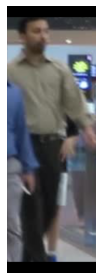

In [14]:
utils.show(utils.smart_resize(det.permute(1,2,0).detach().numpy(), target_size=(600, 200)))

In [13]:
from models.ours.initial_design import BodyDetector
tform = transforms.ToTensor()
img = tform(plt.imread(custom_imgpath))

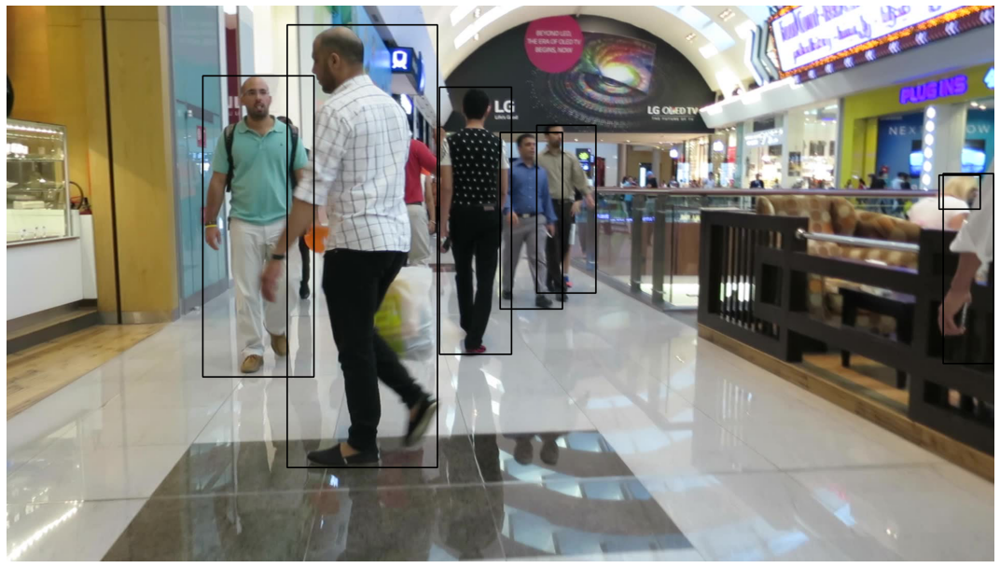

In [35]:
bodydetector = BodyDetector(detector_arch="faster_rcnn")
dets2 = [{'bbox':bbox} for bbox in bodydetector.predict(img)]
utils.show(utils.draw_annotation(custom_imgpath, dets2), size=(15, 15), cformat="bgr")

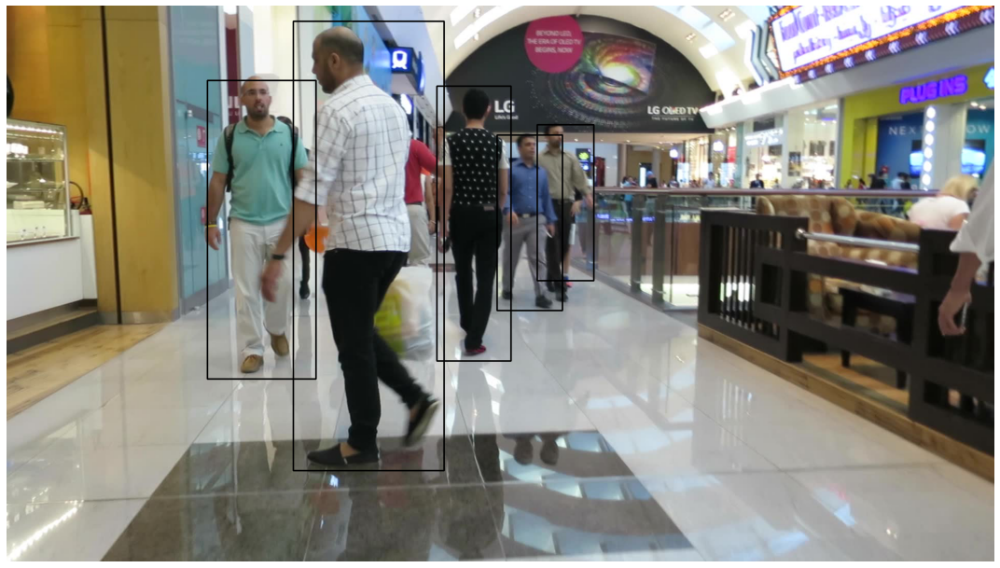

In [14]:
bodydetector = BodyDetector(detector_arch="retinanet")
dets2 = [{'bbox':bbox} for bbox in bodydetector.predict(img)]
utils.show(utils.draw_annotation(custom_imgpath, dets2), size=(15, 15), cformat="bgr")

##### Prediction

In [15]:
def num_params(self, trainable=True):
        return sum(p.numel() for p in self.parameters() if p.requires_grad or not trainable)
print(f"ConvNeXt. Number of parameters for tiny size: {num_params(models.convnext_tiny())}")
print(f"ConvNeXt. Number of parameters for small size: {num_params(models.convnext_small())}")
print(f"ConvNeXt. Number of parameters for base size: {num_params(models.convnext_base())}")
print(f"ConvNeXt. Number of parameters for large size: {num_params(models.convnext_large())}")
print(f"ResNet. Number of parameters for size 18: {num_params(models.resnet18())}")
print(f"ResNet. Number of parameters for size 34: {num_params(models.resnet34())}")
print(f"ResNet. Number of parameters for size 50: {num_params(models.resnet50())}")
print(f"ResNet. Number of parameters for size 101: {num_params(models.resnet101())}")
print(f"ResNet. Number of parameters for size 152: {num_params(models.resnet152())}")

ConvNeXt. Number of parameters for tiny size: 28589128
ConvNeXt. Number of parameters for small size: 50223688
ConvNeXt. Number of parameters for base size: 88591464
ConvNeXt. Number of parameters for large size: 197767336
ResNet. Number of parameters for size 18: 11689512
ResNet. Number of parameters for size 34: 21797672
ResNet. Number of parameters for size 50: 25557032
ResNet. Number of parameters for size 101: 44549160
ResNet. Number of parameters for size 152: 60192808


In [ ]:
custom_imgpath = "/home/emili/Documents/Universitat/TFG/datasets/MOT17-11/img1/000757.jpg"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

frcnn = models.detection.fasterrcnn_resnet50_fpn(pretrained=True, pretrained_backbone=True).to(device).eval()
tform = transforms.ToTensor()
img = tform(Image.open(custom_imgpath))
pred = frcnn([img])[0]

dets = []
for i in range(len(pred['boxes'])):
    bbox = tuple([round(n) for n in pred['boxes'][i].detach().numpy()])
    label, score = int(pred['labels'][i].detach().numpy()), float(pred['scores'][i].detach().numpy())
    if label == 1 and score > 0.95:
        dets.append({'bbox':bbox, 'gender':"Man", 'age':round(score, 2)})

idx = 4
det = transforms.functional.crop(img, top=dets[idx]['bbox'][1], left=dets[idx]['bbox'][0], height=dets[idx]['bbox'][3]-dets[idx]['bbox'][1], width=dets[idx]['bbox'][2]-dets[idx]['bbox'][0])
utils.show(utils.smart_resize(det.permute(1,2,0).detach().numpy(), target_size=(400, 100)))

In [4]:
from models.ours.initial_design import BodyPredictor, BodyBranch

In [18]:
bodypredictor = BodyPredictor(nbins=4, backbone_size="small").eval()

In [19]:
agepred, genpred = bodypredictor(det.unsqueeze(0))
agepred, genpred

(tensor([[0.2903, 0.2426, 0.2477, 0.2194]], grad_fn=<SoftmaxBackward0>),
 tensor([[0.5265]], grad_fn=<SigmoidBackward0>))

In [20]:
age, gen = [pred.detach().numpy()[0] for pred in bodypredictor(det.unsqueeze(0))]
{'age':tuple(age), 'gender':gen[0]}

{'age': (0.2902562, 0.24264926, 0.247691, 0.21940355), 'gender': 0.52649057}

In [5]:
body_branch = BodyBranch()
custom_imgpath = "/home/emili/Documents/Universitat/TFG/datasets/MOT17-11/img1/000757.jpg"
body_branch.predict(custom_imgpath)

[{'bbox': (381, 136, 597, 721),
  'gender': 0.42291945,
  'age': (0.360263, 0.3023802, 0.33735678)},
 {'bbox': (545, 37, 837, 897),
  'gender': 0.41643175,
  'age': (0.35577682, 0.30268118, 0.34154204)},
 {'bbox': (841, 158, 981, 677),
  'gender': 0.42048952,
  'age': (0.36775026, 0.29616985, 0.3360799)},
 {'bbox': (1030, 232, 1145, 558),
  'gender': 0.41490528,
  'age': (0.35915393, 0.30125737, 0.33958873)},
 {'bbox': (959, 246, 1080, 589),
  'gender': 0.42238504,
  'age': (0.3594421, 0.29980102, 0.3407569)}]

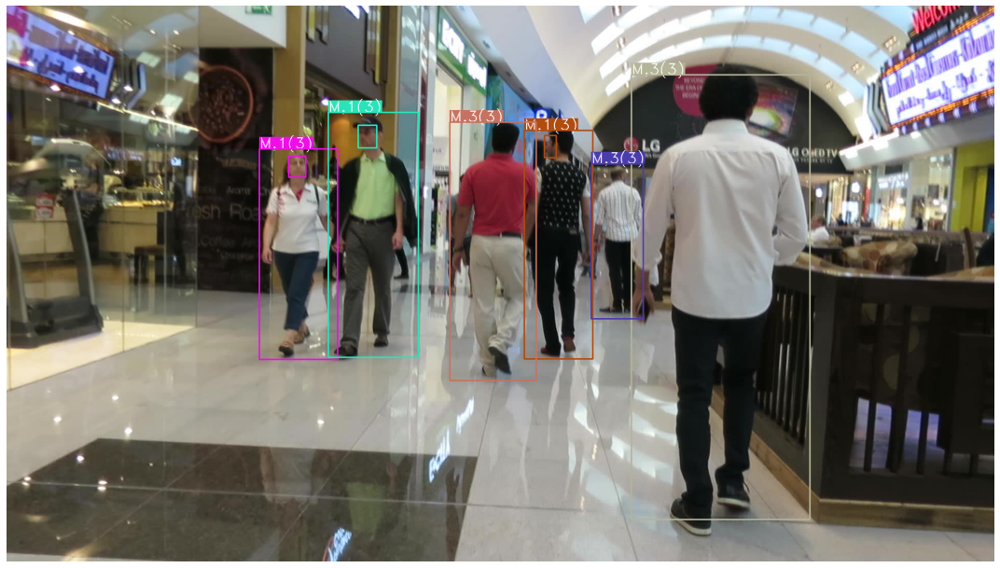

In [2]:
from models.ours.initial_design import EnsembleModel

model = EnsembleModel()
custom_imgpath = "/home/emili/Documents/Universitat/TFG/datasets/MOT17-11/img1/000500.jpg"
preds = model.predict(custom_imgpath)
utils.show(utils.draw_annotation(custom_imgpath, utils.pred2ann(preds)), size=(15, 15), cformat="bgr")

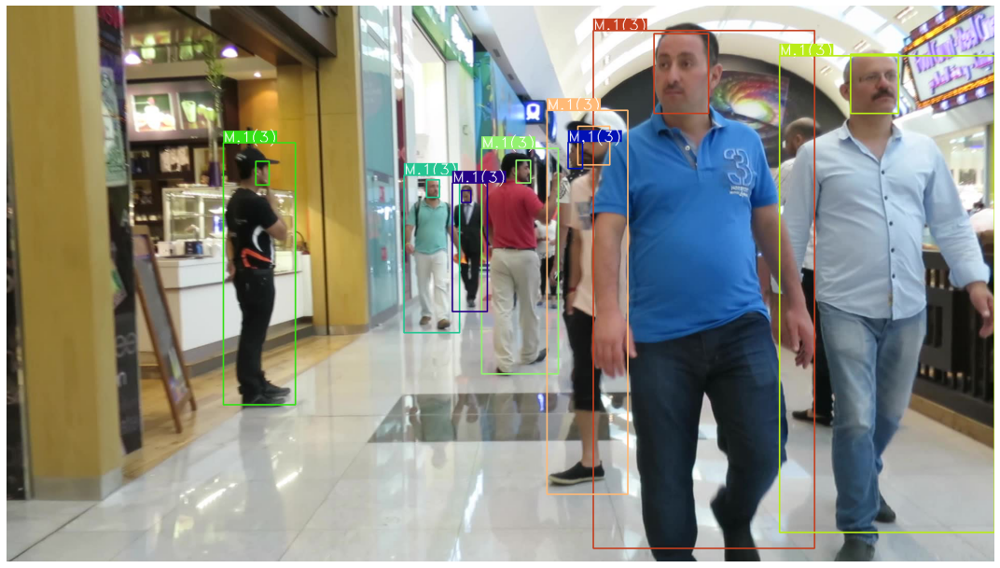

In [11]:
custom_imgpath = "/home/emili/Documents/Universitat/TFG/datasets/MOT17-11/img1/000700.jpg"
preds = model.predict(custom_imgpath)
utils.show(utils.draw_annotation(custom_imgpath, utils.pred2ann(preds)), size=(15, 15), cformat="bgr")

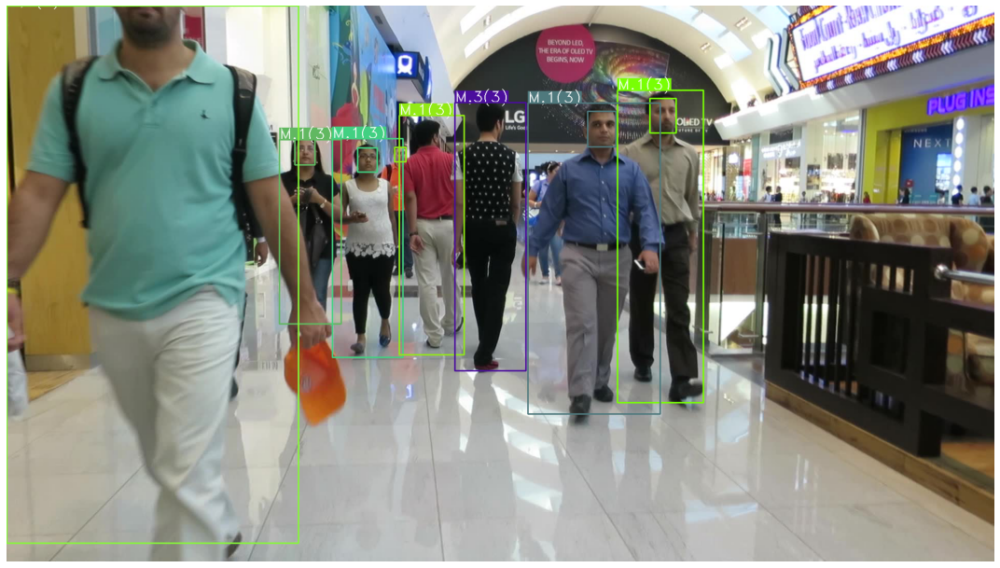

In [9]:
custom_imgpath = "/home/emili/Documents/Universitat/TFG/datasets/MOT17-11/img1/000800.jpg"
preds = model.predict(custom_imgpath)
utils.show(utils.draw_annotation(custom_imgpath, utils.pred2ann(preds)), size=(15, 15), cformat="bgr")

## Pseudo-labelled Dataset

In [27]:
import json
from models.ours.initial_design import EnsembleModel
model = EnsembleModel()

ann = []
with open("/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/body/MOT17-11"+"/imgpaths.txt", 'r') as imgpaths_file:
    for imgpath in [line.strip("\n") for line in imgpaths_file.readlines()]:
        preds = model.predict(imgpath, alpha=1)
        for i in range(len(preds)):
            tmpage = [0]*len(preds[i]['age'])
            tmpage[np.argmax(preds[i]['age'])] = 1
            preds[i]['age'] = tmpage
            preds[i]['gender'] = round(preds[i]['gender'])
        ann.append({'frame_id':imgpath.split("/")[-3]+"/"+imgpath.split("/")[-1], "annotations":preds})
print(json.dumps(ann, indent=4))

/home/emili/Documents/Universitat/TFG/datasets/MOT17-11/img1/000807.jpg
/home/emili/Documents/Universitat/TFG/datasets/MOT17-11/img1/000471.jpg
/home/emili/Documents/Universitat/TFG/datasets/MOT17-11/img1/000348.jpg
/home/emili/Documents/Universitat/TFG/datasets/MOT17-11/img1/000716.jpg
/home/emili/Documents/Universitat/TFG/datasets/MOT17-11/img1/000156.jpg
[
    {
        "frame_id": "MOT17-11/000807.jpg",
        "annotations": [
            {
                "bbb": [
                    520,
                    250,
                    683,
                    657
                ],
                "fbb": [
                    569,
                    255,
                    613,
                    309
                ],
                "age": [
                    1,
                    0,
                    0
                ],
                "gender": 1
            },
            {
                "bbb": [
                    1030,
                    175,
                   

In [4]:
from models.ours.initial_design import BodyBranch
model = BodyBranch()